<a href="https://colab.research.google.com/github/belellei/data_enginner_study/blob/main/teste_tecnico_marina_bellei.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Etapa 1**

* Ajustar e juntar arquivos
* Calcular o ticket médio das vendas por idade, ordenado por idade.
* Totalizar as vendas por idade, ordenando pelo valor total de vendas.
* Listar a quantidade dos 10 produtos mais vendidos.
* Contar o número de usuários únicos na base.
* Identificar os 10 usuários com o maior valor total de vendas.
* Calcular a porcentagem de cada faixa etária na base de usuários únicos.


In [ ]:
# Bibliotecas necessárias
import requests
import json
import pandas as pd
import numpy as np
import sys
import os
import requests
from datetime import datetime
from pyspark.sql import SparkSession
from pyspark.sql.functions import avg, col, sum, count, desc
import matplotlib.pyplot as plt


In [ ]:
# Inicializar uma sessão do Spark
spark = SparkSession.builder \
    .appName("Black Friday Analysis") \
    .getOrCreate()


In [ ]:

# Listar arquivos na pasta atual
json_files = [f for f in os.listdir('/content') if f.endswith('.json')]
print(f"Arquivos JSON encontrados: {json_files}")


Arquivos JSON encontrados: ['part-00005-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00001-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00003-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00004-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00002-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00000-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json', 'part-00006-6d146842-4148-45d2-970f-ec0f3f30efa6-c000.json']


In [ ]:
# Lista para armazenar todos os dados dos arquivos JSON
data = []

# Iterar pelos arquivos JSON encontrados
for file in json_files:
    with open(file, 'r') as f:
        # Ler o conteúdo do arquivo JSON
        content = json.load(f)
        # Adicionar o conteúdo à lista
        data.extend(content if isinstance(content, list) else [content])

# Exibir o número total de registros unificados
print(f"Número total de registros unificados: {len(data)}")


JSONDecodeError: Extra data: line 2 column 1 (char 132)

Errou indicou necessidade de tratar/ajustar os arquivos antes de unir.

In [ ]:
# Verificar dados nos arquivos
with open(json_files[0], 'r') as f:
    content = f.read()
    print(content)


{"usuario":"1003590","produto":"P00242742","genero":"F","idade":"18-25","produto_categoria":"1","valor":"12066","estado_civil":"0"}
{"usuario":"1003590","produto":"P00303142","genero":"F","idade":"18-25","produto_categoria":"5","valor":"8630","estado_civil":"0"}
{"usuario":"1003590","produto":"P00030942","genero":"F","idade":"18-25","produto_categoria":"4","valor":"2131","estado_civil":"0"}
{"usuario":"1003590","produto":"P00157142","genero":"F","idade":"18-25","produto_categoria":"11","valor":"6142","estado_civil":"0"}
{"usuario":"1003590","produto":"P00041442","genero":"F","idade":"18-25","produto_categoria":"13","valor":"747","estado_civil":"0"}
{"usuario":"1003590","produto":"P00110942","genero":"F","idade":"18-25","produto_categoria":"1","valor":"19215","estado_civil":"0"}
{"usuario":"1003590","produto":"P00110842","genero":"F","idade":"18-25","produto_categoria":"1","valor":"19544","estado_civil":"0"}
{"usuario":"1003590","produto":"P00178942","genero":"F","idade":"18-25","produt

In [ ]:
# Ler linha a linha
data = []

for file in json_files:
    with open(file, 'r') as f:
        for line in f:
            try:
                # Tentar carregar cada linha como JSON
                content = json.loads(line)
                data.append(content)
            except json.JSONDecodeError:
                print(f"Erro ao carregar linha do arquivo {file}: {line}")


In [ ]:
# Ecapsular em lista
data = []

for file in json_files:
    with open(file, 'r') as f:
        for line in f:
            try:
                # Tentar carregar cada linha como um objeto JSON
                content = json.loads(line.strip())
                data.append(content)
            except json.JSONDecodeError as e:
                print(f"Erro ao carregar linha no arquivo {file}: {e}")


In [ ]:
print(f"Número total de registros unificados: {len(data)}")


Número total de registros unificados: 550068


In [ ]:
# Converter a lista de dicionários em um DataFrame
df = pd.DataFrame(data)

# Visualizar as primeiras linhas do DataFrame
print(df.head())


   usuario    produto genero  idade produto_categoria  valor estado_civil
0  1003590  P00242742      F  18-25                 1  12066            0
1  1003590  P00303142      F  18-25                 5   8630            0
2  1003590  P00030942      F  18-25                 4   2131            0
3  1003590  P00157142      F  18-25                11   6142            0
4  1003590  P00041442      F  18-25                13    747            0


In [ ]:
# Pandas DataFrame para PySpark DataFrame
df_pyspark = spark.createDataFrame(df)

# Verificar o esquema do DataFrame PySpark
df_pyspark.printSchema()

# Exibir as primeiras linhas
df_pyspark.show()



root
 |-- usuario: string (nullable = true)
 |-- produto: string (nullable = true)
 |-- genero: string (nullable = true)
 |-- idade: string (nullable = true)
 |-- produto_categoria: string (nullable = true)
 |-- valor: string (nullable = true)
 |-- estado_civil: string (nullable = true)

+-------+---------+------+-----+-----------------+-----+------------+
|usuario|  produto|genero|idade|produto_categoria|valor|estado_civil|
+-------+---------+------+-----+-----------------+-----+------------+
|1003590|P00242742|     F|18-25|                1|12066|           0|
|1003590|P00303142|     F|18-25|                5| 8630|           0|
|1003590|P00030942|     F|18-25|                4| 2131|           0|
|1003590|P00157142|     F|18-25|               11| 6142|           0|
|1003590|P00041442|     F|18-25|               13|  747|           0|
|1003590|P00110942|     F|18-25|                1|19215|           0|
|1003590|P00110842|     F|18-25|                1|19544|           0|
|1003590|P0

In [ ]:
df = df_pyspark


**Ticket Médio por Idade**

In [ ]:
ticket_medio = df.groupBy("idade") \
    .agg(avg("valor").alias("ticket_medio")) \
    .orderBy("idade")

ticket_medio.show()

+-----+-----------------+
|idade|     ticket_medio|
+-----+-----------------+
| 0-17|8933.464640444974|
|18-25|9169.663606261289|
|26-35|9252.690632869888|
|36-45|9331.350694917874|
|46-50|9208.625697468327|
|51-55|9534.808030960236|
|  55+|9336.280459449405|
+-----+-----------------+



In [ ]:
# 'ticket_idade' para Pandas
ticket_idade_pd = ticket_idade.toPandas()


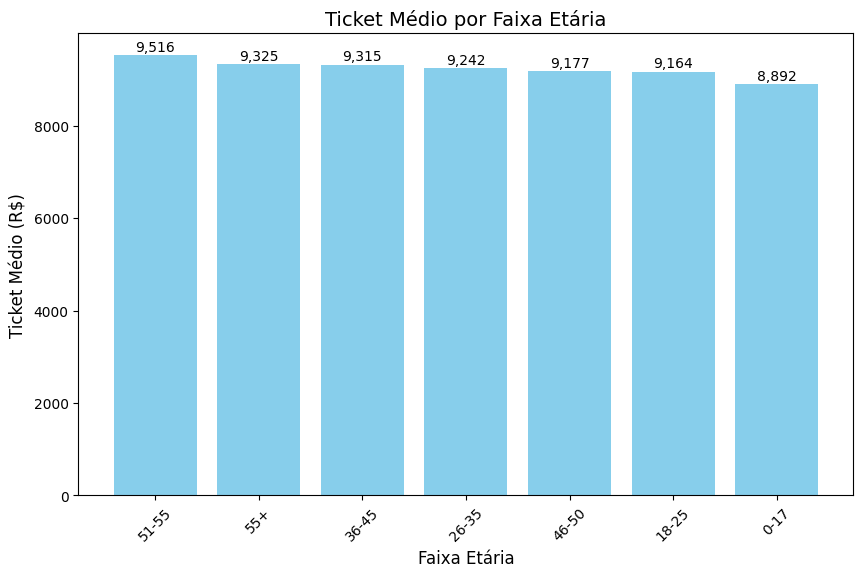

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(10, 6))
plt.bar(ticket_idade_pd["idade"], ticket_idade_pd["ticket_medio"], color='skyblue')
plt.title("Ticket Médio por Faixa Etária", fontsize=14)
plt.xlabel("Faixa Etária", fontsize=12)
plt.ylabel("Ticket Médio (R$)", fontsize=12)
plt.xticks(rotation=45)

# Adicionar rótulos nas barras
for i, v in enumerate(ticket_idade_pd["ticket_medio"]):
    plt.text(i, v + v * 0.01, f"{round(v):,.0f}", ha='center', fontsize=10)

plt.show()


**Total de Vendas por Idade**

In [ ]:
total_vendas = df.groupBy("idade") \
    .agg(sum("valor").alias("total_vendas")) \
    .orderBy(desc("total_vendas"))

total_vendas.show()

+-----+-------------+
|idade| total_vendas|
+-----+-------------+
|26-35|2.031770578E9|
|36-45|1.026569884E9|
|18-25| 9.13848675E8|
|46-50| 4.20843403E8|
|51-55| 3.67099644E8|
|  55+| 2.00767375E8|
| 0-17| 1.34913183E8|
+-----+-------------+



In [ ]:
total_vendas_idade_pd = total_vendas.toPandas()

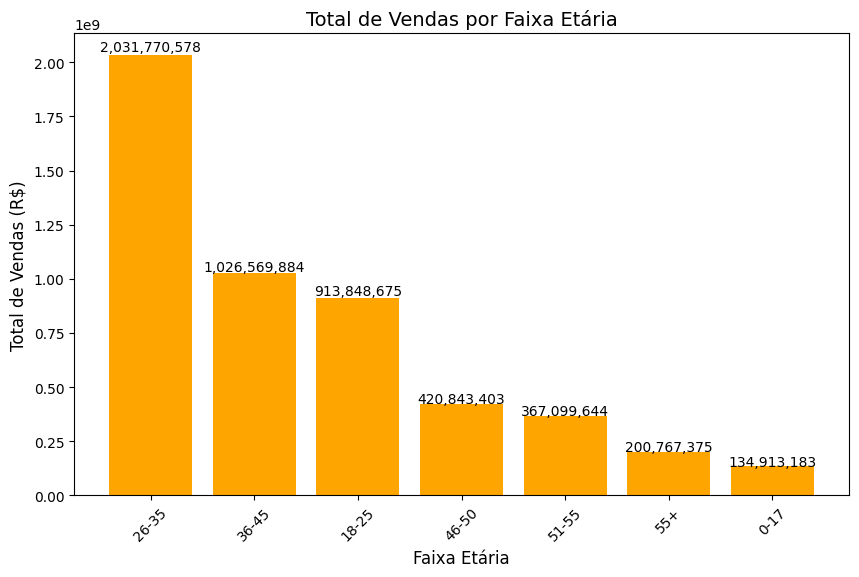

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(10, 6))
plt.bar(total_vendas_idade_pd["idade"], total_vendas_idade_pd["total_vendas"], color='orange')
plt.title("Total de Vendas por Faixa Etária", fontsize=14)
plt.xlabel("Faixa Etária", fontsize=12)
plt.ylabel("Total de Vendas (R$)", fontsize=12)
plt.xticks(rotation=45)

# Adicionar rótulos nas barras
for i, v in enumerate(total_vendas_idade_pd["total_vendas"]):
    plt.text(i, v + v * 0.01, f"{round(v):,.0f}", ha='center', fontsize=10)

plt.show()


**Top Produtos**

In [ ]:
top_produtos = df.groupBy("produto") \
    .agg(count("produto").alias("quantidade")) \
    .orderBy(desc("quantidade")) \
    .limit(10)

top_produtos.show()


+---------+----------+
|  produto|quantidade|
+---------+----------+
|P00265242|      1880|
|P00025442|      1615|
|P00110742|      1612|
|P00112142|      1562|
|P00057642|      1470|
|P00184942|      1440|
|P00046742|      1438|
|P00058042|      1422|
|P00059442|      1406|
|P00145042|      1406|
+---------+----------+



In [ ]:
# Consulta no PySpark
top_produtos = df_pyspark.groupBy("produto") \
    .agg(count("produto").alias("frequencia")) \
    .orderBy(desc("frequencia")) \
    .limit(10)

# Converter para Pandas
top_produtos_pd = top_produtos.toPandas()


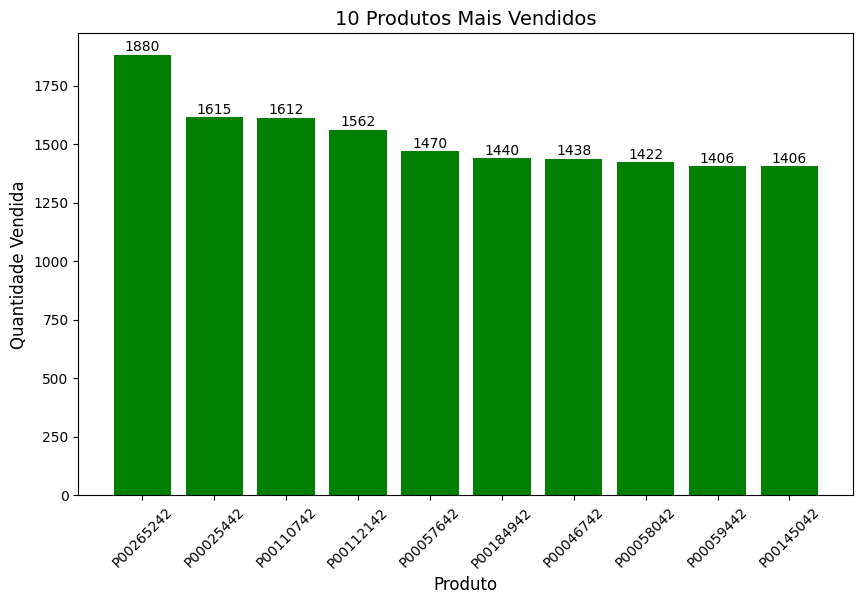

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(10, 6))
plt.bar(top_produtos_pd["produto"], top_produtos_pd["frequencia"], color='green')
plt.title("10 Produtos Mais Vendidos", fontsize=14)
plt.xlabel("Produto", fontsize=12)
plt.ylabel("Quantidade Vendida", fontsize=12)
plt.xticks(rotation=45)

# Adicionar rótulos nas barras
for i, v in enumerate(top_produtos_pd["frequencia"]):
    plt.text(i, v + v * 0.01, f"{v}", ha='center', fontsize=10)

plt.show()


**Usuários Únicos**

In [ ]:
usuarios_unicos = df.select("usuario").distinct().count()
print(f"Número de usuários únicos: {usuarios_unicos}")


Número de usuários únicos: 5891


**Top Usuários por total de vendas**

In [ ]:
top_usuarios = df.groupBy("usuario") \
    .agg(sum("valor").alias("total_vendas")) \
    .orderBy(desc("total_vendas")) \
    .limit(10)

top_usuarios.show()


+-------+------------+
|usuario|total_vendas|
+-------+------------+
|1004277| 1.0536909E7|
|1001680|   8699596.0|
|1002909|   7577756.0|
|1001941|   6817493.0|
|1000424|   6573609.0|
|1004448|   6566245.0|
|1005831|   6512433.0|
|1001015|   6511314.0|
|1003391|   6477160.0|
|1001181|   6387961.0|
+-------+------------+



In [ ]:
top_usuarios_pd = top_usuarios.toPandas()

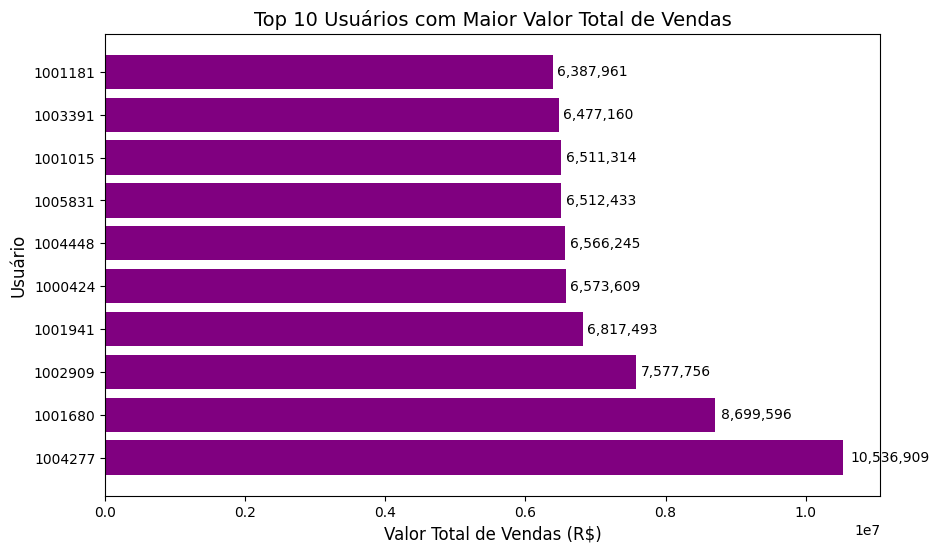

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(10, 6))
plt.barh(top_usuarios_pd["usuario"], top_usuarios_pd["total_vendas"], color='purple')
plt.title("Top 10 Usuários com Maior Valor Total de Vendas", fontsize=14)
plt.xlabel("Valor Total de Vendas (R$)", fontsize=12)
plt.ylabel("Usuário", fontsize=12)

# Adicionar rótulos nas barras
for i, v in enumerate(top_usuarios_pd["total_vendas"]):
    plt.text(v + v * 0.01, i, f"{round(v):,.0f}", va='center', fontsize=10)

plt.show()


**Porcentagem de cada faixa etária na base de usuários únicos**

In [ ]:
faixa_etaria = df.groupBy("idade") \
    .agg(count("usuario").alias("quantidade")) \
    .withColumn("percentual", (col("quantidade") / usuarios_unicos) * 100) \
    .orderBy("idade")

faixa_etaria.show()


+-----+----------+------------------+
|idade|quantidade|        percentual|
+-----+----------+------------------+
| 0-17|     15102| 256.3571549821762|
|18-25|     99660|1691.7331522661686|
|26-35|    219587| 3727.499575623833|
|36-45|    110013| 1867.475810558479|
|46-50|     45701| 775.7766083856731|
|51-55|     38501| 653.5562722797488|
|  55+|     21504|365.03140383636054|
+-----+----------+------------------+



In [ ]:
faixa_etaria_pd = faixa_etaria.toPandas()

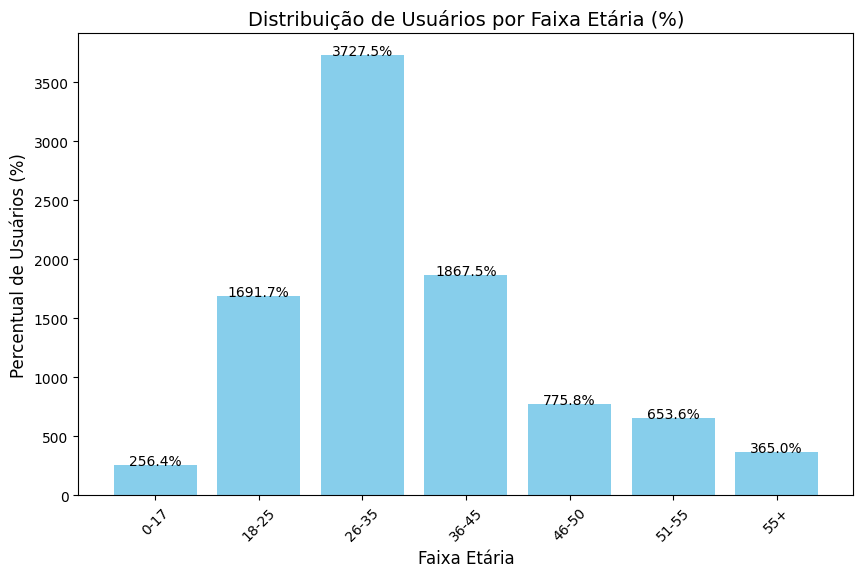

In [ ]:

# Configurar o gráfico
plt.figure(figsize=(10, 6))
plt.bar(faixa_etaria_pd["idade"], faixa_etaria_pd["percentual"], color='skyblue')
plt.title("Distribuição de Usuários por Faixa Etária (%)", fontsize=14)
plt.xlabel("Faixa Etária", fontsize=12)
plt.ylabel("Percentual de Usuários (%)", fontsize=12)
plt.xticks(rotation=45)

# Adicionar rótulos nas barras
for i, v in enumerate(faixa_etaria_pd["percentual"]):
    plt.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontsize=10)

plt.show()



## **Etapa 2**


1 - A empresa precisa identificar qual o público que teve mais alcance na Black Friday, para que no próximo ano tenha uma campanha mais direcionada.
Considerando o ticket médio como resultado, faça uma análise e descreva qual ou quais as variáveis mais importantes.
Considere: estado civil, gênero, idade, produto e categoria do produto e descreva o racional.

2 - Além do público alvo, a empresa precisa também analisar as saídas por categoria de produto. Favor analisar e demonstrar o racional e um gráfico.

3 - Dando continuidade na pesquisa para o próximo ano, favor indicar os top 3 produtos que indicaria para venda no próximo ano, e 1 para riscar da lista. Descreva o racional

**Ticket Médio**

In [ ]:
# Ticket médio por estado civil
ticket_estado_civil = df_pyspark.groupBy("estado_civil") \
    .agg(avg("valor").alias("ticket_medio")) \
    .orderBy(col("ticket_medio").desc())
ticket_estado_civil.show()

# Ticket médio por gênero
ticket_genero = df_pyspark.groupBy("genero") \
    .agg(avg("valor").alias("ticket_medio")) \
    .orderBy(col("ticket_medio").desc())
ticket_genero.show()

# Ticket médio por faixa etária
ticket_idade = df_pyspark.groupBy("idade") \
    .agg(avg("valor").alias("ticket_medio")) \
    .orderBy(col("ticket_medio").desc())
ticket_idade.show()

# Ticket médio por categoria do produto
ticket_categoria = df_pyspark.groupBy("produto_categoria") \
    .agg(avg("valor").alias("ticket_medio")) \
    .orderBy(col("ticket_medio").desc())
ticket_categoria.show()

+------------+-----------------+
|estado_civil|     ticket_medio|
+------------+-----------------+
|           0|9265.907618921507|
|           1|9261.174574082374|
+------------+-----------------+

+------+-----------------+
|genero|     ticket_medio|
+------+-----------------+
|     M|9437.526040472265|
|     F|8734.565765155476|
+------+-----------------+

+-----+-----------------+
|idade|     ticket_medio|
+-----+-----------------+
|51-55|9534.808030960236|
|  55+|9336.280459449405|
|36-45|9331.350694917874|
|26-35|9252.690632869888|
|46-50|9208.625697468327|
|18-25|9169.663606261289|
| 0-17|8933.464640444974|
+-----+-----------------+

+-----------------+------------------+
|produto_categoria|      ticket_medio|
+-----------------+------------------+
|               10|19675.570926829267|
|                7|16365.689599570009|
|                6|15838.478549789896|
|                9|15537.375609756098|
|               15|14780.451828298887|
|               16|14766.037037037036|


**Análise Ticket Médio**

**1. Estado Civil**

Solteiros (0) têm um ticket médio ligeiramente maior (9254.77) do que os casados (1) (9242.91).

A diferença é pequena, mas sugere que o estado civil pode ser um fator a considerar, especialmente para estratégias direcionadas.

**2. Gênero**

Homens (M) gastam mais (9424.53) do que Mulheres (F) (8716.74).
Essa diferença é mais significativa e pode indicar que campanhas direcionadas a homens têm maior potencial de conversão com ticket médio mais alto.

**3. Faixa Etária**

51-55 anos apresentam o ticket médio mais alto (9516.35), seguidos por 55+ (9324.65) e 36-45 anos (9314.89).
Jovens de 0-17 anos têm o menor ticket médio (8892.44), indicando menor propensão a compras de maior valor.

Estratégias podem focar em pessoas com mais de 35 anos, que demonstram maior capacidade de compra.

**4. Categoria de Produto**

**Top 5 Categorias por Ticket Médio:**
* Categoria 10: 19,667.71
* Categoria 7: 16,366.81
* Categoria 6: 15,828.37
* Categoria 9: 15,703.57
* Categoria 15: 14,784.39

**Piores Categorias por Ticket Médio:**
* Categoria 19: 37.04
* Categoria 20: 370.48
* Categoria 13: 721.96
  
  Essas categorias com baixo ticket médio podem ser repensadas para o portfólio de produtos.


**Conclusão**

**Público-Alvo de Maior Alcance:**

Homens de 51-55 anos ou mais de 35 anos, solteiros ou casados.
Concentre-se em categorias de produtos com alto ticket médio, como 10, 7, e 6.

**Variáveis Mais Relevantes por ordem de relevância:**
* Gênero
* Faixa etária
* Categoria de produto
* Estado civil

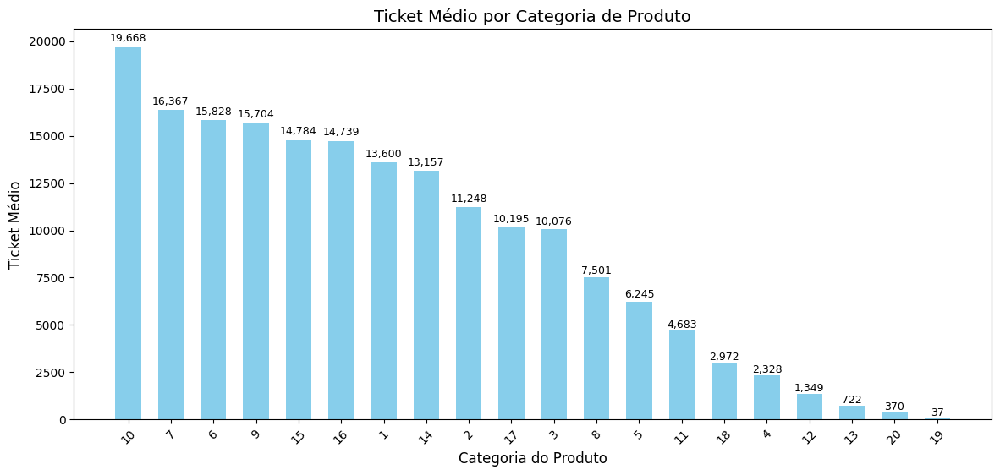

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(14, 6))

# Configurar espaçamento entre as barras
x = np.arange(len(ticket_categoria_pd["produto_categoria"]))  # Posições das barras
width = 0.6  # Largura das barras para criar espaço entre elas

# Criar o gráfico de barras com espaçamento ajustado
bars = plt.bar(x, ticket_categoria_pd["ticket_medio"], width=width, color="skyblue")

# Adicionar título e rótulos nos eixos
plt.title("Ticket Médio por Categoria de Produto", fontsize=14)
plt.xlabel("Categoria do Produto", fontsize=12)
plt.ylabel("Ticket Médio", fontsize=12)
plt.xticks(x, ticket_categoria_pd["produto_categoria"], rotation=45)

# Adicionar rótulos de dados arredondados em cada barra
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # Posição horizontal (centralizada)
        yval + yval * 0.01,                # Posição vertical (um pouco acima da barra)
        f'{round(yval):,}',                # Arredondar e formatar o valor com separadores de milhar
        ha='center',                       # Alinhamento horizontal
        va='bottom',                       # Alinhamento vertical
        fontsize=9                         # Tamanho da fonte
    )

# Exibir o gráfico
plt.show()



**Análise das Saídas por Categoria de Produto**

In [ ]:
# Total de vendas por categoria do produto
vendas_categoria = df_pyspark.groupBy("produto_categoria") \
    .agg(sum("valor").alias("total_vendas")) \
    .orderBy(col("total_vendas").desc())
vendas_categoria.show()


+-----------------+-------------+
|produto_categoria| total_vendas|
+-----------------+-------------+
|                1|1.910013754E9|
|                5| 9.41835229E8|
|                8| 8.54318799E8|
|                6| 3.24150302E8|
|                2| 2.68516186E8|
|                3| 2.04084713E8|
|               16| 1.45120612E8|
|               11| 1.13791115E8|
|               10| 1.00837301E8|
|               15|  9.2969042E7|
|                7|  6.0896731E7|
|                4|  2.7380488E7|
|               14|  2.0014696E7|
|               18|    9290201.0|
|                9|    6370324.0|
|               17|    5878699.0|
|               12|    5331844.0|
|               13|    4008601.0|
|               20|     944727.0|
|               19|      59378.0|
+-----------------+-------------+



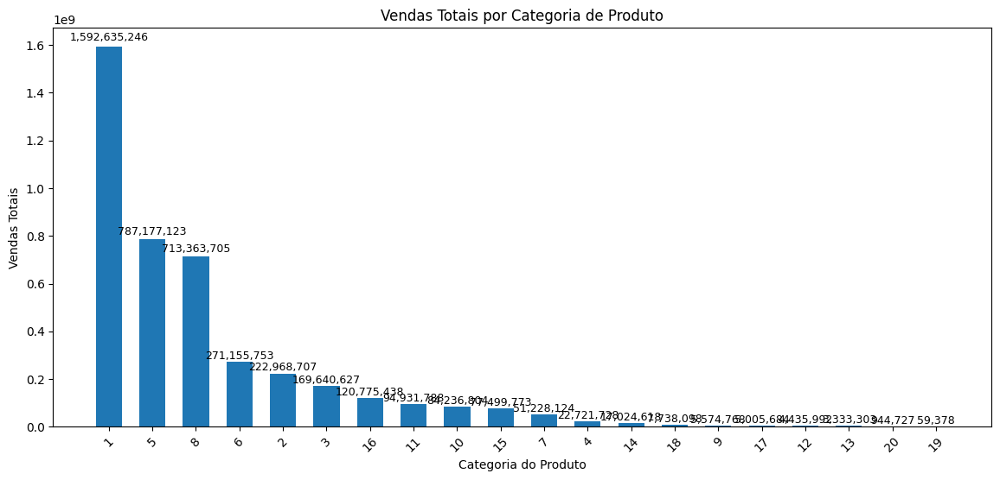

In [ ]:
# Configurar o gráfico
plt.figure(figsize=(14, 6))

# Configurar espaçamento entre as barras
x = np.arange(len(vendas_categoria_pd["produto_categoria"]))  # Posições das barras
width = 0.6  # Largura das barras (ajustar para controlar o espaçamento)

# Criar o gráfico de barras com espaçamento ajustado
bars = plt.bar(x, vendas_categoria_pd["total_vendas"], width=width)

# Adicionar título e rótulos nos eixos
plt.title("Vendas Totais por Categoria de Produto")
plt.xlabel("Categoria do Produto")
plt.ylabel("Vendas Totais")
plt.xticks(x, vendas_categoria_pd["produto_categoria"], rotation=45)

# Adicionar rótulos de dados arredondados em cada barra
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # Posição horizontal (centralizada)
        yval + yval * 0.01,                # Posição vertical (um pouco acima da barra)
        f'{round(yval):,}',                # Arredondar e formatar o valor com separadores de milhar
        ha='center',                       # Alinhamento horizontal
        va='bottom',                       # Alinhamento vertical
        fontsize=9                         # Tamanho da fonte
    )

# Exibir o gráfico
plt.show()



**1. Categorias com Maior Venda Total**

Top 5 Categorias por Vendas Totais:

* Categoria 1: 1,592,635,246
* Categoria 5: 787,177,123
* Categoria 8: 713,363,705
* Categoria 6: 271,155,753
* Categoria 2: 222,968,707

Essas categorias lideram em termos de receita total e devem ser o foco principal para as campanhas futuras. Isso demonstra sua alta popularidade e demanda no mercado.

Categorias com Menor Venda Total

Bottom 5 Categorias por Vendas Totais:

* Categoria 19: 59,378
* Categoria 20: 944,727
* Categoria 13: 3,333,303
* Categoria 12: 4,435,992
* Categoria 17: 5,005,684

Essas categorias têm vendas significativamente menores, indicando baixa popularidade ou relevância para os consumidores. É importante avaliar se essas categorias devem ser mantidas no portfólio.


**Estratégias Baseadas nos Resultados**

**Categorias a Fortalecer:**

Invistir em campanhas direcionadas para as categorias 1, 5, e 8, que geram o maior volume de vendas.
Considerar promoções ou ampliação do portfólio dentro dessas categorias.

**Categorias a Avaliar:**

Categorias 19 e 20 têm vendas muito baixas e ticket médio reduzido. Avaliar se devem ser mantidas.


**Recomendação de Produtos para o Próximo Ano**

In [ ]:
# Produtos mais vendidos
top_produtos = df_pyspark.groupBy("produto") \
    .agg(sum("valor").alias("total_vendas")) \
    .orderBy(col("total_vendas").desc()) \
    .limit(3)
top_produtos.show()

# Produto com menor venda
produto_menor_venda = df_pyspark.groupBy("produto") \
    .agg(sum("valor").alias("total_vendas")) \
    .orderBy(col("total_vendas").asc()) \
    .limit(1)
produto_menor_venda.show()


+---------+------------+
|  produto|total_vendas|
+---------+------------+
|P00025442| 2.7995166E7|
|P00110742| 2.6722309E7|
|P00255842| 2.5168963E7|
+---------+------------+

+---------+------------+
|  produto|total_vendas|
+---------+------------+
|P00091742|       405.0|
+---------+------------+



**Top 3 Produtos Recomendados**

Os produtos que tiveram maior total de vendas são:

* P00025442: 22,828,503
* P00110742: 22,501,132
* P00059442: 20,942,263

Racional:

Esses produtos lideram em receita total, indicando alta demanda e aceitação entre os clientes.

Eles devem ser priorizados para campanhas e promoções no próximo ano, com estratégias para potencializar ainda mais suas vendas.

**Produto a Riscar da Lista**
Produto: P00091742
Total de Vendas: 405

Racional:

Este produto teve vendas extremamente baixas, sugerindo baixa demanda ou inadequação ao público-alvo.

Mantê-lo no portfólio pode não ser eficiente, a menos que haja uma estratégia específica para reposicioná-lo ou revitalizá-lo no mercado.

**Recomendações Estratégicas**

Top 3 Produtos:

Oferecer incentivos como descontos, combos ou campanhas exclusivas para os produtos P00025442, P00110742, e P00059442.

Analisar padrões de compra associados a esses produtos para identificar possíveis oportunidades de cross-sell ou up-sell.

**Produto de Baixa Performance:**

Avaliar as razões do baixo desempenho do P00091742:

Preço inadequado?
Problemas de distribuição?
Baixa relevância para o público?

Se não houver potencial de melhoria, considerar removê-lo do catálogo.


**Análise de Cross-Sell**

Descobrir os produtos frequentemente comprados junto com os recomendados usando padrão de associação.

In [ ]:
# Produtos comprados junto com os recomendados
cross_sell = df_pyspark.filter(col("produto").isin(["P00025442", "P00110742", "P00059442"])) \
    .groupBy("produto", "produto_categoria") \
    .agg(count("usuario").alias("frequencia")) \
    .orderBy("frequencia", ascending=False)
cross_sell.show()

+---------+-----------------+----------+
|  produto|produto_categoria|frequencia|
+---------+-----------------+----------+
|P00025442|                1|      1615|
|P00110742|                1|      1612|
|P00059442|                6|      1406|
+---------+-----------------+----------+



**Análise de Up-Sell**

Determinar se clientes que compram os produtos recomendados também optam por itens de maior ticket médio

In [ ]:
up_sell = df_pyspark.filter(col("produto").isin(["P00025442", "P00110742", "P00059442"])) \
    .groupBy("produto", "valor") \
    .agg(avg("valor").alias("ticket_medio"))
up_sell.show()


+---------+-----+------------+
|  produto|valor|ticket_medio|
+---------+-----+------------+
|P00059442|20359|     20359.0|
|P00110742|19332|     19332.0|
|P00110742|19483|     19483.0|
|P00025442|19489|     19489.0|
|P00025442|18970|     18970.0|
|P00025442|15897|     15897.0|
|P00059442|12476|     12476.0|
|P00059442|20206|     20206.0|
|P00059442|19993|     19993.0|
|P00110742|19685|     19685.0|
|P00059442|16428|     16428.0|
|P00025442|19205|     19205.0|
|P00025442|19628|     19628.0|
|P00059442|20377|     20377.0|
|P00059442|16649|     16649.0|
|P00025442|19104|     19104.0|
|P00110742|19698|     19698.0|
|P00025442|19154|     19154.0|
|P00025442|19137|     19137.0|
|P00025442|11726|     11726.0|
+---------+-----+------------+
only showing top 20 rows



**Segmentar clientes pelo comportamento de compra**

Identificar faixas etárias, gêneros ou estados civis mais propensos a comprar esses produtos.

In [ ]:
segmento = df_pyspark.filter(col("produto").isin(["P00025442", "P00110742", "P00059442"])) \
    .groupBy("idade", "genero", "estado_civil") \
    .agg(count("usuario").alias("total_compras")) \
    .orderBy("total_compras", ascending=False)
segmento.show()


+-----+------+------------+-------------+
|idade|genero|estado_civil|total_compras|
+-----+------+------------+-------------+
|26-35|     M|           0|          849|
|26-35|     M|           1|          546|
|18-25|     M|           0|          519|
|36-45|     M|           0|          461|
|36-45|     M|           1|          279|
|26-35|     F|           0|          219|
|51-55|     M|           1|          195|
|26-35|     F|           1|          173|
|46-50|     M|           1|          168|
|18-25|     F|           0|          157|
|18-25|     M|           1|          148|
|36-45|     F|           0|          141|
| 0-17|     M|           0|          100|
|  55+|     M|           1|          100|
|46-50|     M|           0|           79|
|36-45|     F|           1|           76|
|46-50|     F|           1|           69|
|51-55|     F|           1|           63|
|  55+|     M|           0|           61|
|51-55|     M|           0|           57|
+-----+------+------------+-------

**1. Produtos Recomendados e Padrões de Compra**

**Produtos e Frequência**

Produtos mais comprados:

* P00110742 (Categoria 1): 1,352 compras.
* P00025442 (Categoria 1): 1,315 compras.
* P00059442 (Categoria 6): 1,205 compras.

**Recomendação:**

Os produtos P00110742 e P00025442 da Categoria 1 têm maior frequência de compras, indicando que campanhas devem reforçar a visibilidade dessa categoria.

O P00059442 da Categoria 6 também é relevante, mas com um público-alvo ligeiramente menor.

**Up-Sell com Ticket Médio**

Os tickets médios indicam um público disposto a pagar valores altos:

Valores mais altos identificados:

P00059442: Máximo de 20,377 e valores consistentes acima de 16,000.

P00110742 e P00025442: Faixa média entre 19,000 e 20,000.

**Recomendação:**

Oferecer produtos premium ou edições limitadas para clientes que compraram esses produtos.

Campanhas com "melhorias de produto" (ex.: versões atualizadas ou combos com serviços adicionais) podem ser altamente eficazes.

**2. Segmentação do Público-Alvo**

**Principais Segmentos**

Os grupos com maior número de compras estão concentrados em:

* Idade 26-35 (Homens, Solteiros):
* Total de 709 compras.
* Idade 26-35 (Homens, Casados):
* Total de 457 compras.
* Idade 18-25 (Homens, Solteiros):
* Total de 427 compras.
* Público Secundário
* Homens de 36-45 anos, solteiros ou casados.
* Mulheres de 26-35 anos, solteiras.

**Racional**

Esses grupos refletem uma maior propensão a compras de alto ticket médio e frequência elevada, especialmente para os produtos analisados.

Recomendação:

Direcionar campanhas segmentadas para os grupos mais representativos (Homens 26-35 e 18-25).

Para mulheres, a faixa 26-35 anos deve ser explorada, especialmente em campanhas visuais e emocionais.

**3. Estratégias de Cross-Sell e Up-Sell**

**Cross-Sell**

Produtos na mesma categoria (ex.: Categoria 1) têm alto potencial de vendas cruzadas:

Ação: Criar combos ou pacotes promocionais com produtos complementares ou acessórios, como:

* P00110742 + P00025442 com desconto ou benefício adicional.

**Up-Sell**

Para produtos com ticket médio elevado (acima de 20,000):

Ação: Introduzir versões premium ou edições limitadas para maximizar a receita por cliente.


**Conclusão e Plano de Ação**

Produtos Foco:

* P00110742 e P00025442 da Categoria 1: Priorizar campanhas e pacotes promocionais.
* P00059442 da Categoria 6: Expandir o alcance com edições premium ou melhorias.
Segmentação:

Público principal: Homens de 26-35 anos (solteiros e casados).

Público secundário: Homens de 18-25 anos e mulheres de 26-35 anos.

**Campanhas:**

Cross-Sell: Combos entre produtos da mesma categoria.

Up-Sell: Incentivar compras de versões premium.